# Distortions × Performance Correlation Analysis

1. Load per-image distortion metrics from `distortions_all_datasets.csv`
2. Load YOLO per-image test results for Scenario 1 and Scenario 2
3. Merge by image path
4. Compute correlation tables between distortions and performance
5. Generate plots (correlation heatmap, scatter plots)

## 1. Imports and Paths

In [ ]:
from pathlib import Path
import os
import numpy as np
import matplotlib.pyplot as plt

# Project root:
# - default: current working directory
# - override: set environment variable HT_VISION_ROOT=/path/to/project
ROOT = Path(os.environ.get("HT_VISION_ROOT", Path.cwd())).expanduser().resolve()

# Distortion metrics (per image)
CSV_DISTORTIONS = ROOT / "distortions_all_datasets.csv"

# Per-image performance for each scenario
CSV_PERF_SCEN1 = ROOT / "per_image_results_scenario1_test.csv"
CSV_PERF_SCEN2 = ROOT / "per_image_results_scenario2_test.csv"

CSV_DISTORTIONS, CSV_PERF_SCEN1, CSV_PERF_SCEN2

(PosixPath('/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross_domain_generalization/distortions_all_datasets.csv'),
 PosixPath('/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross_domain_generalization/per_image_results_scenario1_test.csv'),
 PosixPath('/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross_domain_generalization/per_image_results_scenario2_test.csv'))

## 2. Load distortions and per-image performance, then merge

We assume `distortions_all_datasets.csv` has a column `path_rel` that gives the image path
relative to `ROOT`. For YOLO results, we derive the same `path_rel` from the absolute
`image_path` column.

In [2]:
from pathlib import Path
from typing import Optional

import pandas as pd

# ------------------------------------
# Load per-image distortions
# ------------------------------------
distortions = pd.read_csv(CSV_DISTORTIONS)

if "path_rel" not in distortions.columns:
    raise ValueError("distortions_all_datasets.csv must have a 'path_rel' column.")

print("Distortions shape:", distortions.shape)
display(distortions.head())

# Add a 'filename' column derived from 'path_rel'
distortions["filename"] = distortions["path_rel"].apply(lambda p: Path(str(p)).name)

print("\nExample distortions filename values:")
print(distortions["filename"].head())
print("Unique filenames in distortions:", distortions["filename"].nunique())


# ------------------------------------
# Helper to load perf CSV and merge
# ------------------------------------
def load_and_merge_perf(perf_csv_path: Path, root: Optional[Path] = None) -> pd.DataFrame:
    """
    Load per-image performance CSV, derive filename from 'image_path',
    and merge with distortions on filename (Option 1).
    `root` is kept in the signature for compatibility but not used.
    """
    perf = pd.read_csv(perf_csv_path)
    print(f"\nLoaded {perf_csv_path.name}, shape:", perf.shape)
    display(perf.head())

    if "image_path" not in perf.columns:
        raise ValueError("Performance CSV must contain an 'image_path' column.")

    # Ensure string type
    perf["image_path"] = perf["image_path"].astype(str)

    # Extract filename from full image path
    perf["filename"] = perf["image_path"].apply(lambda p: Path(p).name)

    print("\nExample perf filename values:")
    print(perf["filename"].head())
    print("Unique filenames in perf:", perf["filename"].nunique())

    # Merge on filename
    merged = distortions.merge(perf, on="filename", how="inner")
    print("Merged rows:", merged.shape[0])

    if merged.empty:
        print("WARNING: merge on 'filename' produced 0 rows.")
    else:
        display(merged.head())

    return merged


# ------------------------------------
# Merge for Scenario 1 and Scenario 2
# ------------------------------------
merged_scen1 = load_and_merge_perf(CSV_PERF_SCEN1, ROOT)
merged_scen2 = load_and_merge_perf(CSV_PERF_SCEN2, ROOT)

merged_scen1.head()


Distortions shape: (28765, 15)


,dataset,path_rel,turbidity,blue_ratio,green_ratio,red_ratio,contrast,blur_var_laplacian,uiqm,uicm,uism,uiconm,uciqe,fish_count,mean_iou_overlap
0,AquaCoop,AquaCoop/images/AquaCoop_01217.jpg,0.115074,0.332942,0.384627,0.282431,0.066663,2.646765,0.622253,1.264695,0.016715,0.162687,4.712023,23,0.119487
1,AquaCoop,AquaCoop/images/AquaCoop_00109.jpg,0.052302,0.417080,0.323054,0.259867,0.031167,1.020925,0.372260,1.560304,0.008840,0.091083,11.818447,4,0.017392
2,AquaCoop,AquaCoop/images/AquaCoop_01203.jpg,0.130606,0.376721,0.326785,0.296494,0.054079,3.182700,0.597883,2.309086,0.019189,0.147428,5.063146,13,0.109645
3,AquaCoop,AquaCoop/images/AquaCoop_00135.jpg,0.027801,0.414098,0.311070,0.274832,0.021176,1.379734,0.257200,0.832843,0.009740,0.064565,138.845001,3,0.000000
4,AquaCoop,AquaCoop/images/AquaCoop_00653.jpg,0.051603,0.336251,0.382439,0.281310,0.047197,1.901370,0.457774,1.453581,0.013370,0.115469,14.477638,12,0.087872



Example distortions filename values:
0    AquaCoop_01217.jpg
1    AquaCoop_00109.jpg
2    AquaCoop_01203.jpg
3    AquaCoop_00135.jpg
4    AquaCoop_00653.jpg
Name: filename, dtype: object
Unique filenames in distortions: 28765

Loaded per_image_results_scenario1_test.csv, shape: (6517, 11)


,image_path,precision,recall,f1,tp,fp,fn,confidence_mean,iou_mean,model_name,scenario_name
0,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.800000,0.400000,0.533333,4,1,6,0.633489,0.754452,yolo11m,scenario1_all_except_deepfish_test_deepfish
1,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.666667,0.600000,0.631579,6,3,4,0.682416,0.703189,yolo11m,scenario1_all_except_deepfish_test_deepfish
2,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.750000,0.600000,0.666667,6,2,4,0.612965,0.691179,yolo11m,scenario1_all_except_deepfish_test_deepfish
3,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,1.000000,0.500000,0.666667,5,0,5,0.702073,0.765946,yolo11m,scenario1_all_except_deepfish_test_deepfish
4,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,1.000000,0.636364,0.777778,7,0,4,0.600427,0.780193,yolo11m,scenario1_all_except_deepfish_test_deepfish



Example perf filename values:
0    deepfish_00001.jpg
1    deepfish_00002.jpg
2    deepfish_00003.jpg
3    deepfish_00004.jpg
4    deepfish_00005.jpg
Name: filename, dtype: object
Unique filenames in perf: 6517
Merged rows: 6517


,dataset,path_rel,turbidity,blue_ratio,green_ratio,red_ratio,contrast,blur_var_laplacian,uiqm,uicm,...,precision,recall,f1,tp,fp,fn,confidence_mean,iou_mean,model_name,scenario_name
0,deepfish,deepfish/images/deepfish_03879.jpg,0.391083,0.353431,0.343885,0.302684,0.065252,36.852832,0.945713,5.623510,...,0.166667,1.000000,0.285714,1,5,0,0.776627,0.728796,yolo11m,scenario1_all_except_deepfish_test_deepfish
1,deepfish,deepfish/images/deepfish_01908.jpg,0.279408,0.362597,0.373705,0.263698,0.068993,41.489882,1.073097,9.907486,...,0.800000,0.444444,0.571429,4,1,5,0.697730,0.725656,yolo11m,scenario1_all_except_deepfish_test_deepfish
2,deepfish,deepfish/images/deepfish_00394.jpg,0.312860,0.365990,0.384826,0.249184,0.174475,8.544249,1.486357,8.474030,...,0.800000,0.571429,0.666667,4,1,3,0.631720,0.723364,yolo11m,scenario1_all_except_deepfish_test_deepfish
3,deepfish,deepfish/images/deepfish_03845.jpg,0.369009,0.353100,0.343930,0.302970,0.063659,47.054672,0.922822,5.349947,...,0.142857,1.000000,0.250000,1,6,0,0.596927,0.655688,yolo11m,scenario1_all_except_deepfish_test_deepfish
4,deepfish,deepfish/images/deepfish_02583.jpg,0.005119,0.496561,0.470654,0.032784,0.111184,263.153897,1.562849,19.218651,...,0.666667,0.500000,0.571429,2,1,2,0.598415,0.804856,yolo11m,scenario1_all_except_deepfish_test_deepfish



Loaded per_image_results_scenario2_test.csv, shape: (4276, 11)


,image_path,precision,recall,f1,tp,fp,fn,confidence_mean,iou_mean,model_name,scenario_name
0,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.000000,0.0,0.000000,0,1,1,0.000000,0.000000,yolo11m,scenario2_all_except_luderick_test_luderick
1,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.333333,1.0,0.500000,1,2,0,0.811566,0.874761,yolo11m,scenario2_all_except_luderick_test_luderick
2,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.333333,1.0,0.500000,1,2,0,0.901481,0.944298,yolo11m,scenario2_all_except_luderick_test_luderick
3,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.333333,1.0,0.500000,1,2,0,0.901204,0.984772,yolo11m,scenario2_all_except_luderick_test_luderick
4,/mnt/Data1/mpiccolo/HT_Vision/Controlled_cross...,0.500000,1.0,0.666667,1,1,0,0.894453,0.867926,yolo11m,scenario2_all_except_luderick_test_luderick



Example perf filename values:
0    luderick_00001.jpg
1    luderick_00002.jpg
2    luderick_00003.jpg
3    luderick_00004.jpg
4    luderick_00005.jpg
Name: filename, dtype: object
Unique filenames in perf: 4276
Merged rows: 4276


,dataset,path_rel,turbidity,blue_ratio,green_ratio,red_ratio,contrast,blur_var_laplacian,uiqm,uicm,...,precision,recall,f1,tp,fp,fn,confidence_mean,iou_mean,model_name,scenario_name
0,luderick,luderick/images/luderick_03808.jpg,0.156601,0.373765,0.446131,0.180104,0.196986,642.536449,1.712565,13.191848,...,0.6,1.0,0.75,3,2,0,0.871211,0.850146,yolo11m,scenario2_all_except_luderick_test_luderick
1,luderick,luderick/images/luderick_01979.jpg,0.276046,0.348498,0.415940,0.235562,0.146068,599.489806,1.662220,15.763271,...,1.0,1.0,1.00,2,0,0,0.870377,0.867592,yolo11m,scenario2_all_except_luderick_test_luderick
2,luderick,luderick/images/luderick_01789.jpg,0.132292,0.403664,0.475449,0.120887,0.198817,388.844822,1.938310,20.189472,...,0.6,1.0,0.75,3,2,0,0.804171,0.830983,yolo11m,scenario2_all_except_luderick_test_luderick
3,luderick,luderick/images/luderick_01951.jpg,0.276994,0.349248,0.415909,0.234843,0.145456,591.637724,1.665300,15.932907,...,1.0,1.0,1.00,1,0,0,0.864471,0.770439,yolo11m,scenario2_all_except_luderick_test_luderick
4,luderick,luderick/images/luderick_00497.jpg,0.062404,0.427618,0.480330,0.092052,0.173548,670.240471,1.946994,22.735533,...,0.0,0.0,0.00,0,6,1,0.000000,0.000000,yolo11m,scenario2_all_except_luderick_test_luderick


,dataset,path_rel,turbidity,blue_ratio,green_ratio,red_ratio,contrast,blur_var_laplacian,uiqm,uicm,...,precision,recall,f1,tp,fp,fn,confidence_mean,iou_mean,model_name,scenario_name
0,deepfish,deepfish/images/deepfish_03879.jpg,0.391083,0.353431,0.343885,0.302684,0.065252,36.852832,0.945713,5.623510,...,0.166667,1.000000,0.285714,1,5,0,0.776627,0.728796,yolo11m,scenario1_all_except_deepfish_test_deepfish
1,deepfish,deepfish/images/deepfish_01908.jpg,0.279408,0.362597,0.373705,0.263698,0.068993,41.489882,1.073097,9.907486,...,0.800000,0.444444,0.571429,4,1,5,0.697730,0.725656,yolo11m,scenario1_all_except_deepfish_test_deepfish
2,deepfish,deepfish/images/deepfish_00394.jpg,0.312860,0.365990,0.384826,0.249184,0.174475,8.544249,1.486357,8.474030,...,0.800000,0.571429,0.666667,4,1,3,0.631720,0.723364,yolo11m,scenario1_all_except_deepfish_test_deepfish
3,deepfish,deepfish/images/deepfish_03845.jpg,0.369009,0.353100,0.343930,0.302970,0.063659,47.054672,0.922822,5.349947,...,0.142857,1.000000,0.250000,1,6,0,0.596927,0.655688,yolo11m,scenario1_all_except_deepfish_test_deepfish
4,deepfish,deepfish/images/deepfish_02583.jpg,0.005119,0.496561,0.470654,0.032784,0.111184,263.153897,1.562849,19.218651,...,0.666667,0.500000,0.571429,2,1,2,0.598415,0.804856,yolo11m,scenario1_all_except_deepfish_test_deepfish


## 3. Compute correlation tables

We compute correlations between distortion metrics and performance metrics
(`precision`, `recall`, `f1`).

In [3]:
# Distortion metrics to consider (must exist in the distortions CSV)
distortion_cols = [
    "turbidity",
    "contrast",
    "blur_var_laplacian",
    "uiqm",
    "uciqe",
    "uicm",
    "uism",
    "uiconm",
    "blue_ratio",
    "green_ratio",
    "red_ratio",
    "fish_count",
    "mean_iou_overlap",
]

# Per–image performance metrics (adapt if your CSV uses different names)
perf_cols = ["precision", "recall", "f1"]

def compute_corr_table(merged: pd.DataFrame, name: str):
    """
    Calcola:
    - matrice di correlazione completa per tutte le colonne numeriche selezionate
    - tabella 'long' solo per distorsioni ↔ metriche di performance
    """
    # Teniamo solo le colonne che esistono davvero nel DataFrame
    cols_available = [c for c in distortion_cols + perf_cols if c in merged.columns]

    df_num = merged[cols_available].copy()
    df_num = df_num.apply(pd.to_numeric, errors="coerce")

    # Matrice di correlazione completa
    corr = df_num.corr()

    print(f"=== Correlation matrix completa ({name}) ===")
    display(corr)

    # Tabella più compatta: righe = (metrica, distorsione)
    rows = []
    for p in perf_cols:
        if p not in corr.columns:
            continue
        for d in distortion_cols:
            if d not in corr.index:
                continue
            rows.append(
                {
                    "perf_metric": p,
                    "distortion": d,
                    "corr": corr.loc[d, p],
                }
            )

    corr_table = (
        pd.DataFrame(rows)
        .sort_values(["perf_metric", "corr"], ascending=[True, False])
    )

    print(f"\n=== Correlazioni distorsioni vs metriche ({name}) ===")
    display(corr_table)

    return corr, corr_table


# Calcolo per i due scenari
corr_matrix_scen1, corr_table_scen1 = compute_corr_table(merged_scen1, "Scenario 1 (test set)")
corr_matrix_scen2, corr_table_scen2 = compute_corr_table(merged_scen2, "Scenario 2 (test set)")


=== Correlation matrix completa (Scenario 1 (test set)) ===


,turbidity,contrast,blur_var_laplacian,uiqm,uciqe,uicm,uism,uiconm,blue_ratio,green_ratio,red_ratio,fish_count,mean_iou_overlap,precision,recall,f1
turbidity,1.000000,-0.232618,-0.510873,-0.572722,-0.229122,-0.795329,-0.454503,-0.178504,-0.778235,-0.792544,0.938696,-0.113163,-0.011992,-0.121996,0.006464,-0.067005
contrast,-0.232618,1.000000,0.000690,0.829068,0.144380,0.261908,-0.101324,0.986146,0.103862,0.266520,-0.224624,0.215519,0.191127,0.032810,-0.062728,-0.006397
blur_var_laplacian,-0.510873,0.000690,1.000000,0.393811,0.396451,0.636342,0.841267,0.030840,0.463362,0.385233,-0.505350,0.147619,-0.069381,0.043780,-0.037198,0.009717
uiqm,-0.572722,0.829068,0.393811,1.000000,0.497091,0.743179,0.319657,0.836665,0.462384,0.517880,-0.586765,0.263481,0.142817,0.077596,-0.071715,0.016044
uciqe,-0.229122,0.144380,0.396451,0.497091,1.000000,0.681026,0.540637,0.156153,0.253408,-0.032934,-0.125810,0.318641,0.118939,0.026581,-0.022828,0.003469
uicm,-0.795329,0.261908,0.636342,0.743179,0.681026,1.000000,0.608667,0.255935,0.759616,0.584297,-0.799255,0.200417,0.053231,0.102254,-0.035411,0.043933
uism,-0.454503,-0.101324,0.841267,0.319657,0.540637,0.608667,1.000000,-0.060222,0.306953,0.308309,-0.367592,0.231335,-0.092463,0.038634,-0.002199,0.021221
uiconm,-0.178504,0.986146,0.030840,0.836665,0.156153,0.255935,-0.060222,1.000000,0.054588,0.271254,-0.199128,0.210761,0.166622,0.029440,-0.074862,-0.012303
blue_ratio,-0.778235,0.103862,0.463362,0.462384,0.253408,0.759616,0.306953,0.054588,1.000000,0.400236,-0.824152,-0.093472,-0.011625,0.002890,-0.052125,-0.028847
green_ratio,-0.792544,0.266520,0.385233,0.517880,-0.032934,0.584297,0.308309,0.271254,0.400236,1.000000,-0.848882,0.121109,-0.010380,0.182112,-0.014382,0.107344



=== Correlazioni distorsioni vs metriche (Scenario 1 (test set)) ===


,perf_metric,distortion,corr
37,f1,fish_count,0.395564
38,f1,mean_iou_overlap,0.126746
35,f1,green_ratio,0.107344
31,f1,uicm,0.043933
32,f1,uism,0.021221
29,f1,uiqm,0.016044
28,f1,blur_var_laplacian,0.009717
30,f1,uciqe,0.003469
27,f1,contrast,-0.006397
33,f1,uiconm,-0.012303


=== Correlation matrix completa (Scenario 2 (test set)) ===


,turbidity,contrast,blur_var_laplacian,uiqm,uciqe,uicm,uism,uiconm,blue_ratio,green_ratio,red_ratio,fish_count,mean_iou_overlap,precision,recall,f1
turbidity,1.000000,0.209290,0.113679,-0.304811,0.093893,-0.796533,0.062062,0.310897,-0.891695,-0.765290,0.958603,-0.140184,-0.035514,0.275679,-0.158966,0.197525
contrast,0.209290,1.000000,0.392833,0.758590,0.006512,0.029334,0.389243,0.987773,-0.208959,-0.114900,0.200481,0.063895,0.084128,-0.032120,-0.120985,-0.030221
blur_var_laplacian,0.113679,0.392833,1.000000,0.325305,0.023627,-0.002042,0.830060,0.391950,-0.093836,-0.297347,0.182159,0.150260,0.134074,0.072686,-0.146893,0.048065
uiqm,-0.304811,0.758590,0.325305,1.000000,-0.049851,0.662301,0.420174,0.734151,0.362100,0.216672,-0.353993,0.144468,0.090150,-0.102371,0.094111,-0.038770
uciqe,0.093893,0.006512,0.023627,-0.049851,1.000000,-0.094975,0.045713,0.015925,-0.115424,-0.073267,0.114414,-0.037854,-0.005636,-0.004048,-0.063064,-0.019712
uicm,-0.796533,0.029334,-0.002042,0.662301,-0.094975,1.000000,0.127998,-0.020491,0.865722,0.532055,-0.851598,0.161133,0.044812,-0.154793,0.268595,-0.056714
uism,0.062062,0.389243,0.830060,0.420174,0.045713,0.127998,1.000000,0.390862,-0.066750,-0.342866,0.178822,0.153148,0.174610,-0.023134,-0.193237,-0.052424
uiconm,0.310897,0.987773,0.391950,0.734151,0.015925,-0.020491,0.390862,1.000000,-0.295656,-0.169229,0.286156,0.039502,0.070602,0.003601,-0.105022,0.002576
blue_ratio,-0.891695,-0.208959,-0.093836,0.362100,-0.115424,0.865722,-0.066750,-0.295656,1.000000,0.517025,-0.947113,0.216615,0.062813,-0.165481,0.243243,-0.076483
green_ratio,-0.765290,-0.114900,-0.297347,0.216672,-0.073267,0.532055,-0.342866,-0.169229,0.517025,1.000000,-0.764363,-0.102594,-0.112642,-0.256533,0.176906,-0.190305



=== Correlazioni distorsioni vs metriche (Scenario 2 (test set)) ===


,perf_metric,distortion,corr
26,f1,turbidity,0.197525
37,f1,fish_count,0.160374
36,f1,red_ratio,0.128958
28,f1,blur_var_laplacian,0.048065
38,f1,mean_iou_overlap,0.016055
33,f1,uiconm,0.002576
30,f1,uciqe,-0.019712
27,f1,contrast,-0.030221
29,f1,uiqm,-0.038770
32,f1,uism,-0.052424


## 4. Visualise correlations and example scatter plots

We plot:
- A simple heatmap-style view of `recall` vs selected distortion metrics.
- A scatter plot of `turbidity` vs `recall` for Scenario 1.

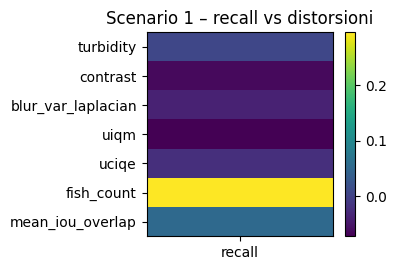

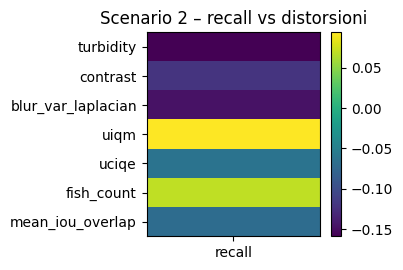

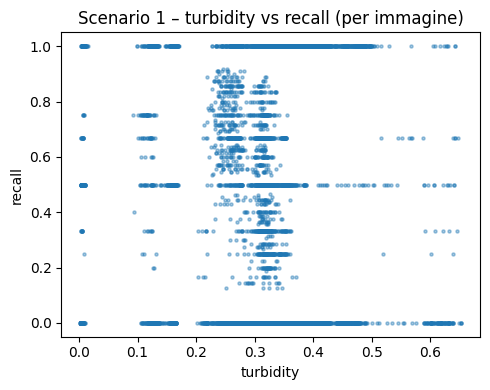

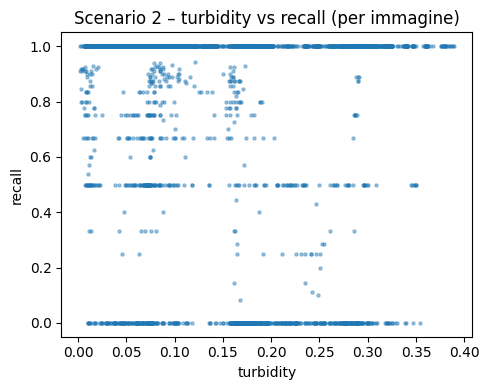

In [4]:
# --- Heatmap-style plot per una singola metrica (es. recall) vs distorsioni ---

selected_distortions = [
    "turbidity",
    "contrast",
    "blur_var_laplacian",
    "uiqm",
    "uciqe",
    "fish_count",
    "mean_iou_overlap",
]

def plot_corr_heatmap(corr_matrix, distortions, perf_metric="recall", title="Correlation heatmap"):
    # Teniamo solo le distorsioni presenti nella matrice
    dists = [d for d in distortions if d in corr_matrix.index]
    if perf_metric not in corr_matrix.columns:
        print(f"{perf_metric} non presente nella matrice di correlazione.")
        return

    values = np.array([corr_matrix.loc[d, perf_metric] for d in dists]).reshape(-1, 1)

    fig, ax = plt.subplots(figsize=(4, max(2, 0.4 * len(dists))))
    im = ax.imshow(values, aspect="auto")

    ax.set_yticks(np.arange(len(dists)))
    ax.set_yticklabels(dists)
    ax.set_xticks([0])
    ax.set_xticklabels([perf_metric])

    ax.set_title(title)
    fig.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.show()


# Heatmap per i due scenari (esempio con recall)
plot_corr_heatmap(
    corr_matrix_scen1,
    selected_distortions,
    perf_metric="recall",
    title="Scenario 1 – recall vs distorsioni",
)

plot_corr_heatmap(
    corr_matrix_scen2,
    selected_distortions,
    perf_metric="recall",
    title="Scenario 2 – recall vs distorsioni",
)

# --- Scatter: turbidity vs recall per entrambi gli scenari ---

if "turbidity" in merged_scen1.columns and "recall" in merged_scen1.columns:
    fig, ax = plt.subplots(figsize=(5, 4))
    ax.scatter(merged_scen1["turbidity"], merged_scen1["recall"], s=5, alpha=0.4)
    ax.set_xlabel("turbidity")
    ax.set_ylabel("recall")
    ax.set_title("Scenario 1 – turbidity vs recall (per immagine)")
    plt.tight_layout()
    plt.show()
else:
    print("'turbidity' o 'recall' non presenti in merged_scen1.")

if "turbidity" in merged_scen2.columns and "recall" in merged_scen2.columns:
    fig, ax = plt.subplots(figsize=(5, 4))
    ax.scatter(merged_scen2["turbidity"], merged_scen2["recall"], s=5, alpha=0.4)
    ax.set_xlabel("turbidity")
    ax.set_ylabel("recall")
    ax.set_title("Scenario 2 – turbidity vs recall (per immagine)")
    plt.tight_layout()
    plt.show()
else:
    print("'turbidity' o 'recall' non presenti in merged_scen2.")


## Correlation Matrix


=== Correlation matrix completa (Scenario 1 (test set)) ===


,turbidity,contrast,blur_var_laplacian,uiqm,uciqe,uicm,uism,uiconm,blue_ratio,green_ratio,red_ratio,fish_count,mean_iou_overlap,precision,recall,f1
turbidity,1.000000,-0.232618,-0.510873,-0.572722,-0.229122,-0.795329,-0.454503,-0.178504,-0.778235,-0.792544,0.938696,-0.113163,-0.011992,-0.121996,0.006464,-0.067005
contrast,-0.232618,1.000000,0.000690,0.829068,0.144380,0.261908,-0.101324,0.986146,0.103862,0.266520,-0.224624,0.215519,0.191127,0.032810,-0.062728,-0.006397
blur_var_laplacian,-0.510873,0.000690,1.000000,0.393811,0.396451,0.636342,0.841267,0.030840,0.463362,0.385233,-0.505350,0.147619,-0.069381,0.043780,-0.037198,0.009717
uiqm,-0.572722,0.829068,0.393811,1.000000,0.497091,0.743179,0.319657,0.836665,0.462384,0.517880,-0.586765,0.263481,0.142817,0.077596,-0.071715,0.016044
uciqe,-0.229122,0.144380,0.396451,0.497091,1.000000,0.681026,0.540637,0.156153,0.253408,-0.032934,-0.125810,0.318641,0.118939,0.026581,-0.022828,0.003469
uicm,-0.795329,0.261908,0.636342,0.743179,0.681026,1.000000,0.608667,0.255935,0.759616,0.584297,-0.799255,0.200417,0.053231,0.102254,-0.035411,0.043933
uism,-0.454503,-0.101324,0.841267,0.319657,0.540637,0.608667,1.000000,-0.060222,0.306953,0.308309,-0.367592,0.231335,-0.092463,0.038634,-0.002199,0.021221
uiconm,-0.178504,0.986146,0.030840,0.836665,0.156153,0.255935,-0.060222,1.000000,0.054588,0.271254,-0.199128,0.210761,0.166622,0.029440,-0.074862,-0.012303
blue_ratio,-0.778235,0.103862,0.463362,0.462384,0.253408,0.759616,0.306953,0.054588,1.000000,0.400236,-0.824152,-0.093472,-0.011625,0.002890,-0.052125,-0.028847
green_ratio,-0.792544,0.266520,0.385233,0.517880,-0.032934,0.584297,0.308309,0.271254,0.400236,1.000000,-0.848882,0.121109,-0.010380,0.182112,-0.014382,0.107344


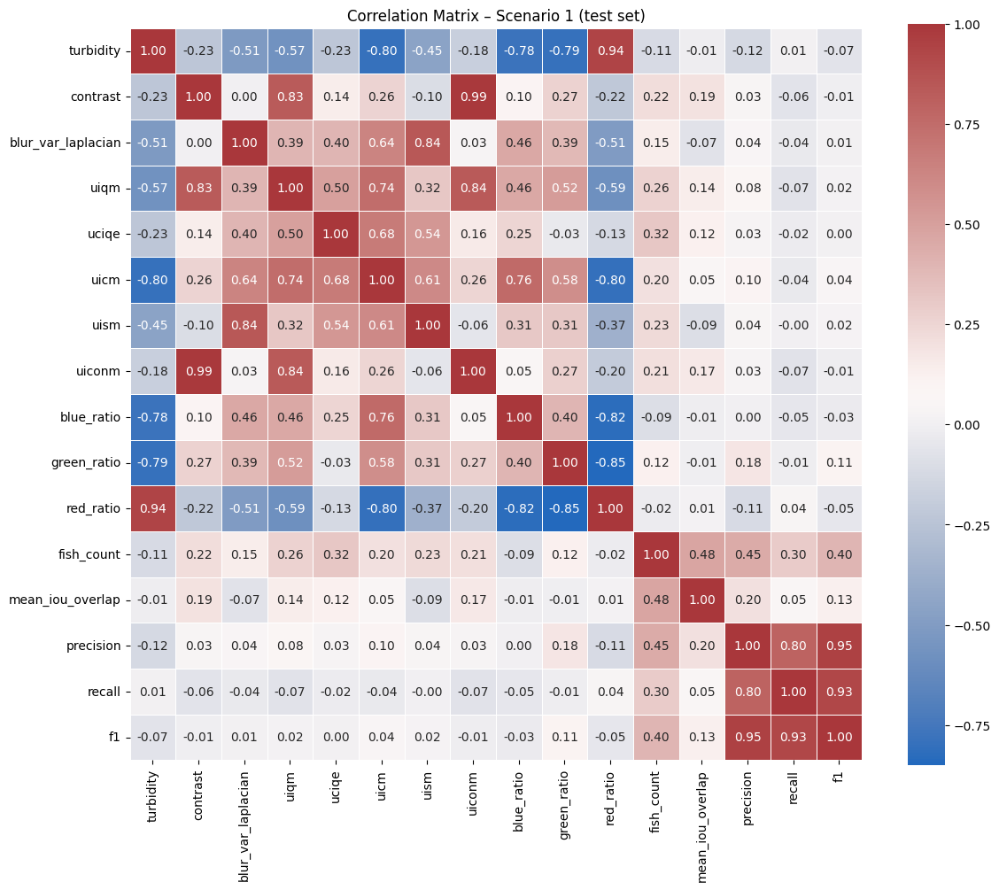


=== Heatmap Distortion ↔ Performance (Scenario 1 (test set)) ===


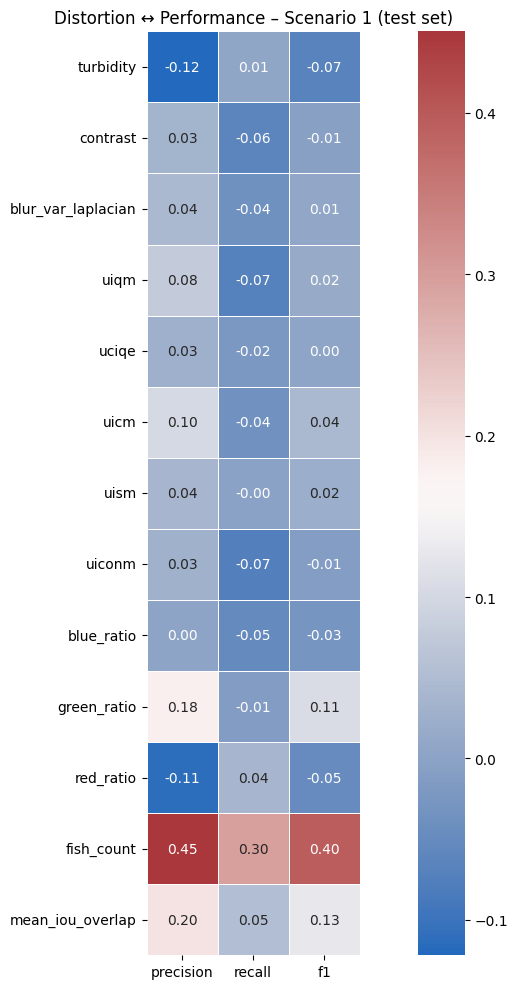

,perf_metric,distortion,corr
37,f1,fish_count,0.395564
38,f1,mean_iou_overlap,0.126746
35,f1,green_ratio,0.107344
31,f1,uicm,0.043933
32,f1,uism,0.021221
29,f1,uiqm,0.016044
28,f1,blur_var_laplacian,0.009717
30,f1,uciqe,0.003469
27,f1,contrast,-0.006397
33,f1,uiconm,-0.012303



=== Correlation matrix completa (Scenario 2 (test set)) ===


,turbidity,contrast,blur_var_laplacian,uiqm,uciqe,uicm,uism,uiconm,blue_ratio,green_ratio,red_ratio,fish_count,mean_iou_overlap,precision,recall,f1
turbidity,1.000000,0.209290,0.113679,-0.304811,0.093893,-0.796533,0.062062,0.310897,-0.891695,-0.765290,0.958603,-0.140184,-0.035514,0.275679,-0.158966,0.197525
contrast,0.209290,1.000000,0.392833,0.758590,0.006512,0.029334,0.389243,0.987773,-0.208959,-0.114900,0.200481,0.063895,0.084128,-0.032120,-0.120985,-0.030221
blur_var_laplacian,0.113679,0.392833,1.000000,0.325305,0.023627,-0.002042,0.830060,0.391950,-0.093836,-0.297347,0.182159,0.150260,0.134074,0.072686,-0.146893,0.048065
uiqm,-0.304811,0.758590,0.325305,1.000000,-0.049851,0.662301,0.420174,0.734151,0.362100,0.216672,-0.353993,0.144468,0.090150,-0.102371,0.094111,-0.038770
uciqe,0.093893,0.006512,0.023627,-0.049851,1.000000,-0.094975,0.045713,0.015925,-0.115424,-0.073267,0.114414,-0.037854,-0.005636,-0.004048,-0.063064,-0.019712
uicm,-0.796533,0.029334,-0.002042,0.662301,-0.094975,1.000000,0.127998,-0.020491,0.865722,0.532055,-0.851598,0.161133,0.044812,-0.154793,0.268595,-0.056714
uism,0.062062,0.389243,0.830060,0.420174,0.045713,0.127998,1.000000,0.390862,-0.066750,-0.342866,0.178822,0.153148,0.174610,-0.023134,-0.193237,-0.052424
uiconm,0.310897,0.987773,0.391950,0.734151,0.015925,-0.020491,0.390862,1.000000,-0.295656,-0.169229,0.286156,0.039502,0.070602,0.003601,-0.105022,0.002576
blue_ratio,-0.891695,-0.208959,-0.093836,0.362100,-0.115424,0.865722,-0.066750,-0.295656,1.000000,0.517025,-0.947113,0.216615,0.062813,-0.165481,0.243243,-0.076483
green_ratio,-0.765290,-0.114900,-0.297347,0.216672,-0.073267,0.532055,-0.342866,-0.169229,0.517025,1.000000,-0.764363,-0.102594,-0.112642,-0.256533,0.176906,-0.190305


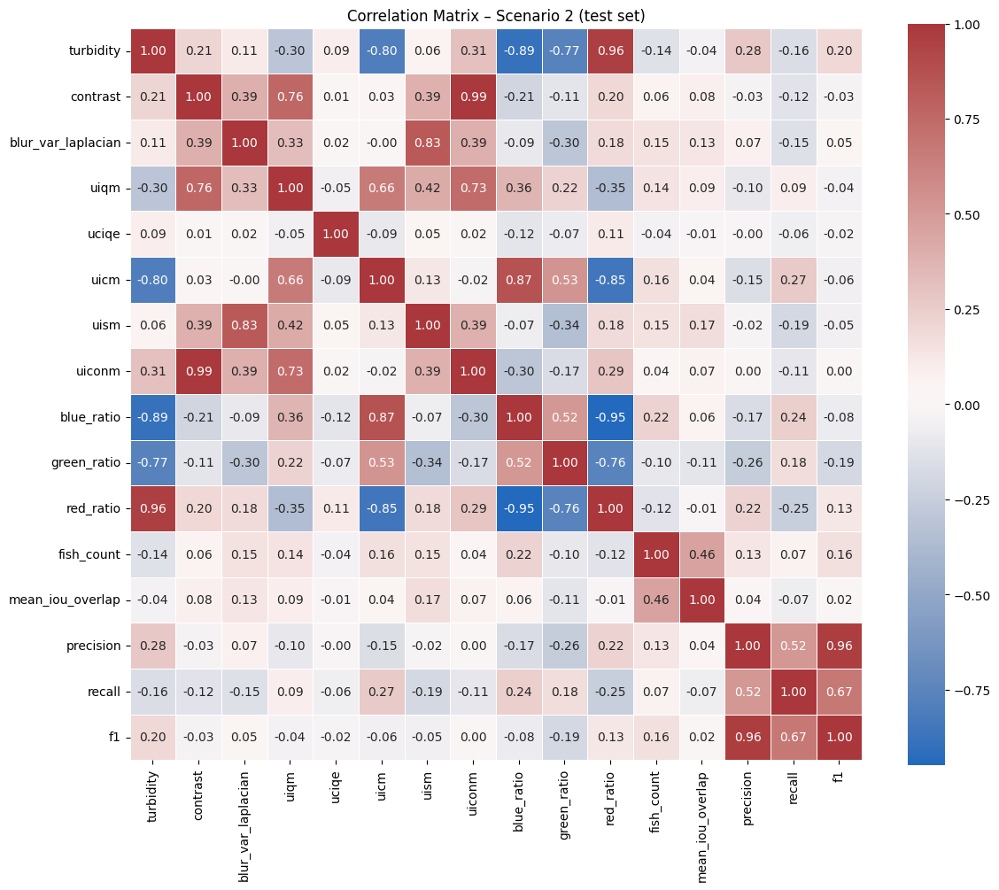


=== Heatmap Distortion ↔ Performance (Scenario 2 (test set)) ===


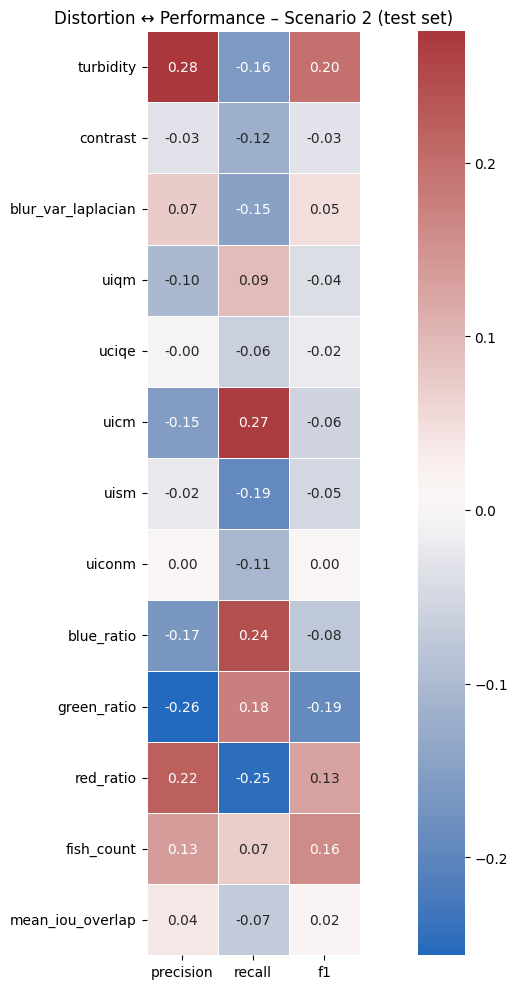

,perf_metric,distortion,corr
26,f1,turbidity,0.197525
37,f1,fish_count,0.160374
36,f1,red_ratio,0.128958
28,f1,blur_var_laplacian,0.048065
38,f1,mean_iou_overlap,0.016055
33,f1,uiconm,0.002576
30,f1,uciqe,-0.019712
27,f1,contrast,-0.030221
29,f1,uiqm,-0.038770
32,f1,uism,-0.052424


In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


# --- Colonne di distorsione (incluse le nuove) ---
distortion_cols = [
    "turbidity",
    "contrast",
    "blur_var_laplacian",
    "uiqm",
    "uciqe",
    "uicm",
    "uism",
    "uiconm",
    "blue_ratio",
    "green_ratio",
    "red_ratio",
    "fish_count",        # NEW: numero di pesci GT nell'immagine
    "mean_iou_overlap",  # NEW: overlap medio tra bounding box GT
]

# --- Metriche performance ---
# Assicurati che i nomi coincidano con le colonne reali nel DataFrame merged_*
perf_cols = ["precision", "recall", "f1", "mAP50", "mAP50_95", "mAP50-95"]


def plot_heatmap(corr, title):
    """Heatmap grafica della matrice delle correlazioni"""
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="vlag",
        linewidths=0.5,
        square=True,
        cbar=True,
    )
    plt.title(title)
    plt.tight_layout()
    plt.show()


def compute_corr_table(merged: pd.DataFrame, name: str):
    cols_available = [c for c in distortion_cols + perf_cols if c in merged.columns]

    if not cols_available:
        print(f"Nessuna colonna valida trovata in {name}")
        return None, None

    df_num = merged[cols_available].copy()
    df_num = df_num.apply(pd.to_numeric, errors="coerce")

    corr = df_num.corr()

    print(f"\n=== Correlation matrix completa ({name}) ===")
    display(corr)

    # 🔥 HEATMAP COMPLETA (distorsioni + metriche)
    plot_heatmap(corr, f"Correlation Matrix – {name}")

    # 🔥 HEATMAP SOLO Distortion ↔ Performance
    perf_avail = [p for p in perf_cols if p in corr.columns]
    distort_avail = [d for d in distortion_cols if d in corr.columns]

    if perf_avail and distort_avail:
        corr_perf = corr.loc[distort_avail, perf_avail]
        print(f"\n=== Heatmap Distortion ↔ Performance ({name}) ===")
        plot_heatmap(corr_perf, f"Distortion ↔ Performance – {name}")

    # Tabella long-form per analisi ordinata
    rows = []
    for p in perf_avail:
        for d in distort_avail:
            rows.append({
                "perf_metric": p,
                "distortion": d,
                "corr": corr.loc[d, p],
            })

    corr_table = pd.DataFrame(rows).sort_values(
        ["perf_metric", "corr"], ascending=[True, False]
    )
    display(corr_table)

    return corr, corr_table


# ---- Esegui per i due scenari ----
corr_matrix_scen1, corr_table_scen1 = compute_corr_table(
    merged_scen1, "Scenario 1 (test set)"
)

corr_matrix_scen2, corr_table_scen2 = compute_corr_table(
    merged_scen2, "Scenario 2 (test set)"
)

## Pair Plot

Distortion columns usate per i pairplot:
['turbidity', 'contrast', 'blur_var_laplacian', 'uiqm', 'uciqe', 'uicm', 'uism', 'uiconm', 'blue_ratio', 'green_ratio', 'red_ratio', 'fish_count', 'mean_iou_overlap']

Performance metrics usate per i pairplot:
['precision', 'recall', 'f1']

Pairplot per Scenario 1 (test set) con colonne: ['turbidity', 'contrast', 'blur_var_laplacian', 'uiqm', 'uciqe', 'uicm', 'uism', 'uiconm', 'blue_ratio', 'green_ratio', 'red_ratio', 'fish_count', 'mean_iou_overlap', 'precision', 'recall', 'f1'] (righe valide: 6517)


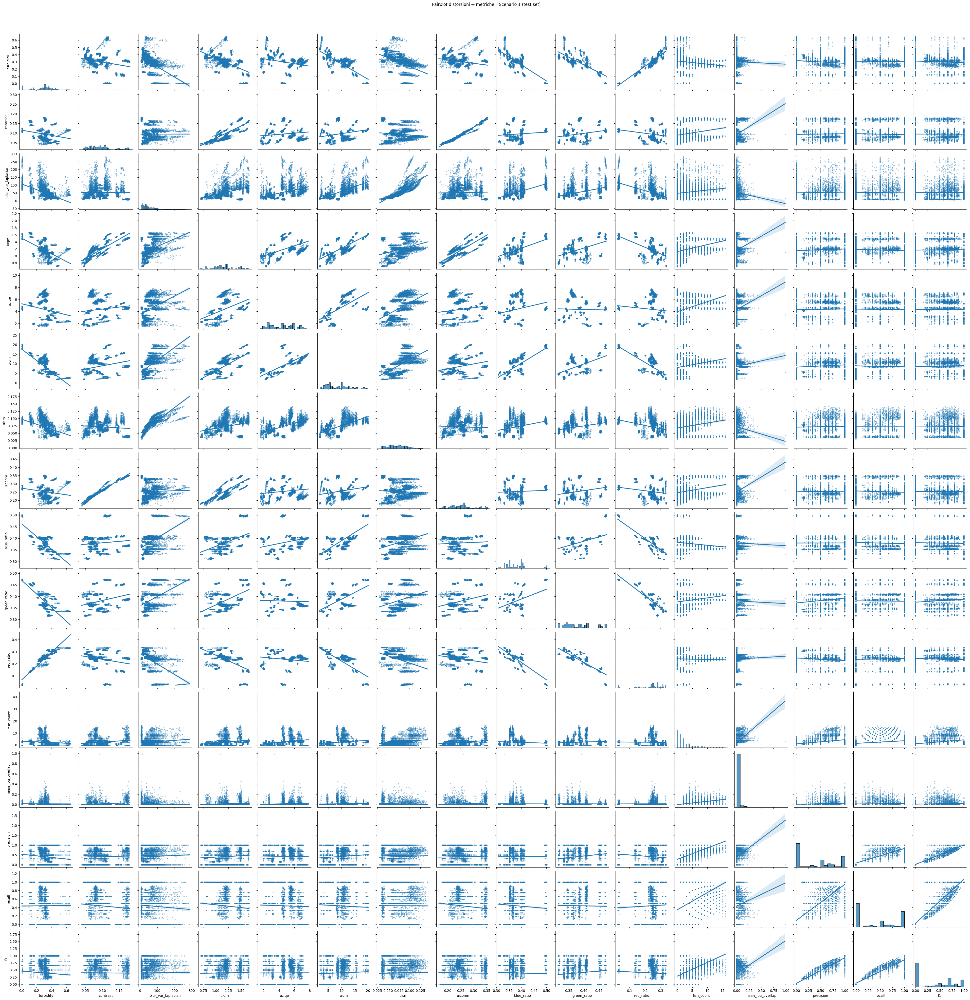


Pairplot per Scenario 2 (test set) con colonne: ['turbidity', 'contrast', 'blur_var_laplacian', 'uiqm', 'uciqe', 'uicm', 'uism', 'uiconm', 'blue_ratio', 'green_ratio', 'red_ratio', 'fish_count', 'mean_iou_overlap', 'precision', 'recall', 'f1'] (righe valide: 4276)


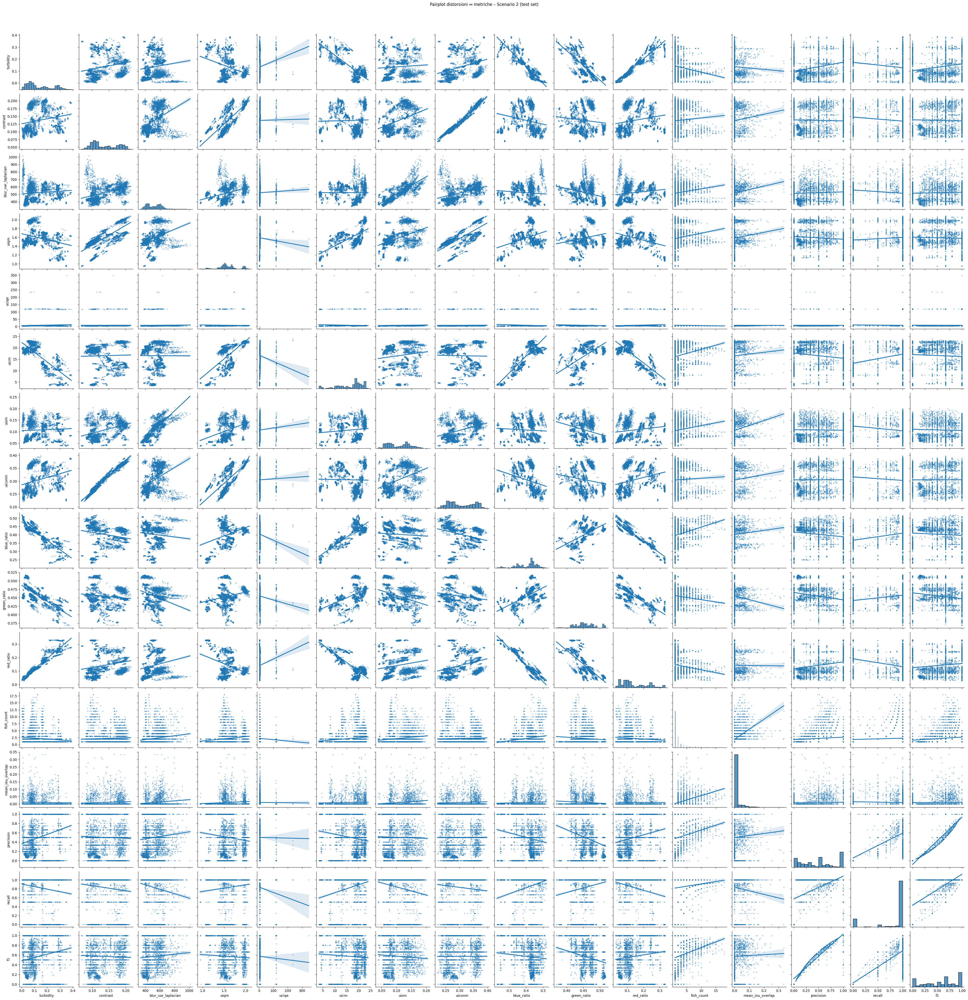

In [6]:
import seaborn as sns

# --- Definizione colonne di distorsione (incluse le nuove) ---
distortion_cols = [
    "turbidity",
    "contrast",
    "blur_var_laplacian",
    "uiqm",
    "uciqe",
    "uicm",
    "uism",
    "uiconm",
    "blue_ratio",
    "green_ratio",
    "red_ratio",
    "fish_count",        # nuova variabile: numero di pesci annotati nell'immagine
    "mean_iou_overlap",  # nuova variabile: overlap medio tra bounding box GT
]

# --- Metriche di performance (adatta se hai aggiunto altre colonne nel CSV) ---
perf_cols = [
    "precision",
    "recall",
    "f1",
    # se in futuro aggiungi metriche per immagine tipo mAP50_image, mAP5095_image, puoi metterle qui
]

print("Distortion columns usate per i pairplot:")
print(distortion_cols)
print("\nPerformance metrics usate per i pairplot:")
print(perf_cols)


def plot_pairplot(merged: pd.DataFrame, name: str):
    """
    Crea un pairplot distorsioni ↔ metriche di performance.
    Verranno usate solo le colonne effettivamente presenti nel DataFrame.
    """
    # Teniamo solo le colonne che esistono davvero nel DataFrame
    cols_available = [c for c in distortion_cols + perf_cols if c in merged.columns]
    df_plot = merged[cols_available].copy()
    df_plot = df_plot.apply(pd.to_numeric, errors="coerce").dropna()

    print(f"\nPairplot per {name} con colonne: {cols_available} (righe valide: {len(df_plot)})")

    if df_plot.empty:
        print("Nessun dato numerico disponibile per il pairplot.")
        return

    g = sns.pairplot(
        df_plot,
        kind="reg",
        plot_kws={"scatter_kws": {"s": 5, "alpha": 0.3}}
    )
    g.fig.suptitle(f"Pairplot distorsioni ↔ metriche – {name}", y=1.02)
    plt.show()


# Pairplot per Scenario 1
plot_pairplot(merged_scen1, "Scenario 1 (test set)")

# Pairplot per Scenario 2
plot_pairplot(merged_scen2, "Scenario 2 (test set)")
